# Term frequency-inverse document frequency (TFIDF) and Cosine Similarity<a class="tocSkip"></a>

_<a href= "mailto:alexander.dunkel@tu-dresden.de">Alexander Dunkel</a>, TU Dresden, Institute of Cartography;  Maximilian Hartmann and Ross Purves Universität Zürich (UZH), Geocomputation;_

----------------

In [4]:
from IPython.display import Markdown as md
from datetime import date

today = date.today()
with open('/.version', 'r') as file: app_version = file.read().split("'")[1]
md(f"Last updated: {today.strftime('%b-%d-%Y')}, [Carto-Lab Docker](https://gitlab.vgiscience.de/lbsn/tools/jupyterlab) Version {app_version}")

Last updated: Oct-08-2022, [Carto-Lab Docker](https://gitlab.vgiscience.de/lbsn/tools/jupyterlab) Version 0.9.0

Visualization of TFIDF and Cosine Similarity Values

The values loaded here have been generated outside Jupyter, in a separate process. This notebook only visualizes data.

# Preparations
## Load dependencies

We continue from notebook `05_countries.ipynb`, importing all previously defined methods and top level variables.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
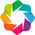

Chromedriver loaded. Svg output enabled.


In [5]:
import sys
from pathlib import Path
module_path = str(Path.cwd().parents[0] / "py")
if module_path not in sys.path:
    sys.path.append(module_path)
# import all previous chained notebooks
from _05_countries import *
from modules import preparations
preparations.init_imports()
WEB_DRIVER = preparations.load_chromedriver()

Activate autoreload of changed python files:

In [6]:
%load_ext autoreload
%autoreload 2

## Load aggregate topic data

Data is stored as aggregate HLL data (postcount) for each term.

In [7]:
root = Path.cwd().parents[1] / "00_topic_data"
TERMS_FLICKR_TFIDF = root / "20210202_FLICKR_SUNSET_random_country_tf_idf.csv"
TERMS_FLICKR_COSINE = root / "20211029_FLICKR_SUNSET_random_country_cosine_similarity_binary.csv"

Some statistics for these files:

In [8]:
%%time
data_files = {
    "TERMS_FLICKR_TFIDF":TERMS_FLICKR_TFIDF,
    "TERMS_FLICKR_COSINE":TERMS_FLICKR_COSINE,
    }
tools.display_file_stats(data_files)

name,TERMS_FLICKR_TFIDF,TERMS_FLICKR_COSINE
size,57.85 KB,974.43 KB
records,226,226


CPU times: user 42.4 ms, sys: 4.59 ms, total: 47 ms
Wall time: 107 ms


#### Load Cosine Similarity

Get as pandas dataframe

In [9]:
def load_cosine_df(csv: Path = TERMS_FLICKR_COSINE) -> pd.DataFrame:
    """Load CSV with cosine similarity values per country"""
    df = pd.read_csv(csv, encoding='utf-8', skiprows=0, index_col=0)
    # Since this is a matrix of similarity values, 
    # set index = column names and skip first row (header)
    df.columns = df.index
    return df

In [10]:
df_cos = load_cosine_df()

In [11]:
df_cos.head()

,BFR,INX,CHE,IDN,USB,ITX,ZAX,MEX,CAN,ENG,...,CPV,AZE,HND,MDA,ALD,INA,BLM,LIE,ITP,GUF
BFR,1.000000,0.176804,0.194586,0.192786,0.088246,0.138522,0.201482,0.175484,0.164773,0.118088,...,0.101952,0.097359,0.125799,0.095063,0.082795,0.105904,0.074893,0.087826,0.051295,0.105382
INX,0.176804,1.000000,0.166689,0.185919,0.109039,0.142907,0.187739,0.162928,0.166713,0.138435,...,0.074961,0.070127,0.095374,0.066170,0.060736,0.087176,0.050504,0.058790,0.036975,0.069739
CHE,0.194586,0.166689,1.000000,0.171150,0.096301,0.157435,0.178351,0.159385,0.164147,0.122183,...,0.080351,0.072332,0.099305,0.070520,0.063698,0.077771,0.054618,0.074115,0.043080,0.083936
IDN,0.192786,0.185919,0.171150,1.000000,0.085915,0.127157,0.193810,0.171063,0.156392,0.112681,...,0.096579,0.087764,0.118133,0.083325,0.078152,0.099819,0.063213,0.075742,0.049091,0.093572
USB,0.088246,0.109039,0.096301,0.085915,1.000000,0.110259,0.091638,0.091926,0.130047,0.143619,...,0.026635,0.023089,0.037211,0.023858,0.019907,0.025114,0.018317,0.020239,0.014332,0.026182


#### Load TFIDF

In [12]:
def load_tfidf_df(csv: Path = TERMS_FLICKR_TFIDF) -> pd.DataFrame:
    """Load CSV with TFIDF ranking for country"""
    df = pd.read_csv(csv, encoding='utf-8', header=0, index_col=0)
    return df

In [13]:
df_tfidf = load_tfidf_df()

In [14]:
df_tfidf.head()

,TERM_1,TF_IDF_1,TERM_2,TF_IDF_2,TERM_3,TF_IDF_3,TERM_4,TF_IDF_4,TERM_5,TF_IDF_5,...,TERM_16,TF_IDF_16,TERM_17,TF_IDF_17,TERM_18,TF_IDF_18,TERM_19,TF_IDF_19,TERM_20,TF_IDF_20
COUNTRY_CODE,,,,,,,,,,,,,,,,,,,,,
ABW,sunset,237.04,beach,81.75,ocean,75.27,sun,71.35,palm,69.74,...,sand,40.54,and,36.71,arubasunset,36.53,boats,36.00,island,34.75
ACA,sunset,103.00,heights,31.31,shirley,31.29,english,27.28,clouds,25.68,...,bay,16.95,shirleyheights,16.34,englishharbour,16.28,from,16.18,this,16.05
AFG,sunset,124.64,sun,27.91,mountains,24.86,clouds,21.84,over,20.47,...,war,10.08,army,10.08,evening,9.93,shadow,9.85,light,9.85
AGO,sunset,89.23,sun,28.24,sky,20.02,the,18.21,landscape,16.94,...,nature,10.54,okavango,10.30,near,10.30,luanda,9.90,and,9.76
AIA,sunset,28.30,caribbean,11.88,ocean,7.87,the,6.86,sun,6.81,...,beautiful,4.84,landscape,4.84,sea,4.04,anguilla,3.98,our,3.94


Combine top terms into single column, drop all other columns

In [15]:
cols = [f'TERM_{ix}'for ix in range(1,20)]
df_tfidf['tfidf'] = df_tfidf[cols].apply(lambda row: ' '.join(row.values.astype(str)), axis=1)
drop_cols_except(df_tfidf, ['tfidf'])
df_tfidf.head()

,tfidf
COUNTRY_CODE,
ABW,sunset beach ocean sun palm sky sea clouds the...
ACA,sunset heights shirley english clouds sun the ...
AFG,sunset sun mountains clouds over sky dusk land...
AGO,sunset sun sky the landscape namibia africa ri...
AIA,sunset caribbean ocean the sun clouds sky trav...


## Combine with country shapes
### Load country geometries

In [16]:
def load_country_geom(
    ne_path: Path = NE_PATH, ne_uri: str = NE_URI, ne_filename: str = NE_FILENAME,
    crs_proj: str = CRS_PROJ, country_col: str = COUNTRY_COL) -> gp.GeoDataFrame:
    """Load country geometry and set SU_A3 column as index"""
    world = gp.read_file(
        ne_path / ne_filename.replace(".zip", ".shp"))
    world = world.to_crs(crs_proj)
    columns_keep = ['geometry', country_col, 'ADMIN']
    drop_cols_except(world, columns_keep)
    world.set_index(country_col, inplace=True)
    return world

In [17]:
world = load_country_geom()
world.head()

,ADMIN,geometry
SU_A3,,
ZWE,Zimbabwe,"POLYGON ((2987278.542 -2742733.921, 2979383.40..."
ZMB,Zambia,"POLYGON ((2976200.722 -1924957.705, 2961959.54..."
YEM,Yemen,"MULTIPOLYGON (((5181525.454 2047361.573, 51352..."
YES,Yemen,"POLYGON ((5307347.563 1557616.990, 5313584.814..."
VNM,Vietnam,"MULTIPOLYGON (((10323687.558 1282070.654, 1032..."


This GeoDataFrame can be visualized using interactive Holoviews:

In [18]:
gv.Polygons(world, crs=crs.Mollweide())

:Polygons   [Longitude,Latitude]   (ADMIN)

### Combine data

Load world geometry and add cosine value for specific country ref

In [19]:
def load_combine(su_a3_ref: str, value_df: pd.DataFrame):
    """Add selected data for country ref"""
    world = load_country_geom()
    world.loc[value_df.index, "cosine"] = value_df[su_a3_ref]
    # Set selected country to NaN, which is always 1 
    # and can therefore be excluded from the classification process
    world.loc[su_a3_ref, "cosine"] = np.nan
    # add tfidf values
    world.loc[df_tfidf.index, "tfidf"] = df_tfidf['tfidf']
    world.tfidf = world.tfidf.fillna('')
    return world

### Test

Example: UGA (Uganda)

In [20]:
world = load_combine("UGA", df_cos)

In [21]:
world.head()

,ADMIN,geometry,cosine,tfidf
SU_A3,,,,
ZWE,Zimbabwe,"POLYGON ((2987278.542 -2742733.921, 2979383.40...",0.205237,sunset sun lake zambezi river the kariba afric...
ZMB,Zambia,"POLYGON ((2976200.722 -1924957.705, 2961959.54...",0.204533,sunset river zambezi sun cruise the africa ove...
YEM,Yemen,"MULTIPOLYGON (((5181525.454 2047361.573, 51352...",0.184590,sunset sky cloud the nature clouds night lands...
YES,Yemen,"POLYGON ((5307347.563 1557616.990, 5313584.814...",NaN,
VNM,Vietnam,"MULTIPOLYGON (((10323687.558 1282070.654, 1032...",0.132540,sunset sun sky the vietnam landscape river asi...


<AxesSubplot:>

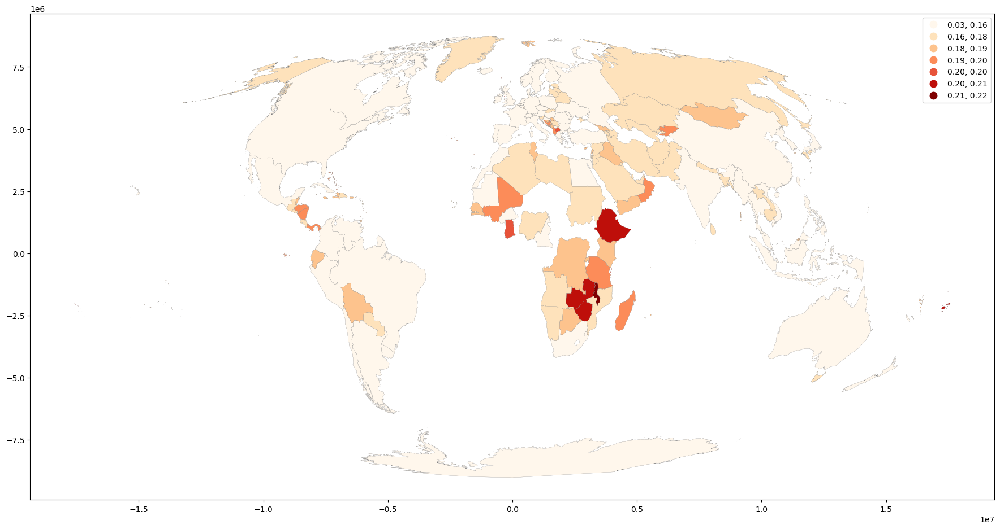

In [22]:
fig, ax = plt.subplots(1, 1, figsize=(22,28))
world.plot(
    column='cosine',
    cmap='OrRd',
    ax=ax,
    linewidth=0.2,
    edgecolor='grey',
    legend=True,
    scheme='headtail_breaks')

## Visualize using Holoviews

Combine load, combine and plotting functions first.

Prepare methods. The first one is needed to plot country polygons in `hv` using geoviews `gv.Polygons`. The syntax is very similar to `convert_gdf_to_gvimage()`. There are further slight adjustments necessary to other methods, which are copied from previous notebooks.

In [23]:
def convert_gdf_to_gvpolygons(
        poly_gdf: gp.GeoDataFrame, metric: str, cat_count: Optional[int] = None, 
        cat_min: Optional[int] = None, cat_max: Optional[int] = None,
        hover_items: Dict[str, str] = None) -> gv.Polygons:
    """Convert GeoDataFrame to gv.polygons using categorized
    metric column as value dimension
    
    Args:
        poly_gdf: A geopandas geodataframe with  
            (projected coordinates) and aggregate metric column
        metric: target column for value dimension.
            "_cat" will be added to retrieve classified values.
        cat_count: number of classes for value dimension
        hover_items: a dictionary with optional names 
            and column references that are included in 
            gv.Image to provide additional information
            (e.g. on hover)
    """
    if cat_count:
        cat_min = 0
        cat_max = cat_count
    else:
        if any([cat_min, cat_max]) is None:
            raise ValueError(
                "Either provide cat_count or cat_min and cat_max.")
    if hover_items is None:
        hover_items_list = []
    else:
        hover_items_list = [
            v for v in hover_items.values()]
    # convert GeoDataFrame to gv.Polygons Layer
    # the first vdim is the value being used 
    # to visualize classes on the map
    # include additional_items (postcount and usercount)
    # to show exact information through tooltip
    gv_layer = gv.Polygons(
        poly_gdf,
        vdims=[
            hv.Dimension(
                f'{metric}_cat', range=(cat_min, cat_max))]
            + hover_items_list,
        crs=crs.Mollweide())
    return gv_layer

In [24]:
from _02_visualization import assign_special_categories # use original definition
def get_classify_poly(poly_gdf: gp.GeoDataFrame,
    metric: str = "cosine", responsive: bool = None,
    hover_items: Dict[str, str] = None,
    mask_nonsignificant: bool = False,
    scheme: str = "HeadTailBreaks",
    cmap_name: str = "OrRd",
    cosine_country: str = None):
    """Get and classify gv layer from geodataframe (polygon)

    Args:
        poly_gdf: A geopandas geodataframe with  
            (projected coordinates) and aggregate metric column
        metric: target column for aggregate. Default: cosine.
        responsive: Should be True for interactive HTML output.
        hover_items: additional items to show on hover
        mask_nonsignificant: transparent bins if significant column == False
        scheme: The classification scheme to use. Default "HeadTailBreaks".
        cmap: The colormap to use. Default "OrRd".
    """
    
    # get value series, excluding special categories
    kwargs = {
        "mask_nonsignificant":mask_nonsignificant
    }
    series_nan = mask_series(
        grid=poly_gdf, metric=metric, **kwargs)
    # classify values
    bounds, scheme_breaks = classify_data(
        values_series=series_nan, scheme=scheme)
    # assign categories column
    poly_gdf.loc[series_nan.index, f'{metric}_cat'] = scheme_breaks.find_bin(
        series_nan)
    # set for hover info, after classification
    poly_gdf.loc[cosine_country, "cosine"] = 1.0
    # assign special categories (nodata, not significant, not representative)
    assign_special_categories(
        grid=poly_gdf, values_series=series_nan,
        metric=metric, add_nodata_label=None, **kwargs)
    cat_count = scheme_breaks.k
    cmap_list = get_cmap_list(cmap_name, length_n=cat_count)
    # spare cats are added to legend,
    # but have no representation on the map
    # (e.g. White "No Data" Label)
    # create cmap and labels
    label_dict = create_labels(
        cmap_list, bounds, **kwargs)
    # cosine mod: 
    # make sure that largest label tick is always 1
    max_key = max(label_dict.keys())
    label_dict[max_key] = '1'
    cmap = colors.ListedColormap(cmap_list)
    # create gv.Polygons layer from gdf
    gv_poly = convert_gdf_to_gvpolygons(
            poly_gdf=poly_gdf,
            metric=metric, cat_count=cat_count,
            hover_items=hover_items)
    return gv_poly, cmap, label_dict

In [25]:
def compile_poly_layer(poly_gdf: gp.GeoDataFrame,
    metric: str = "postcount_est", responsive: bool = None,
    hover_items: Dict[str, str] = None,
    mask_nonsignificant: bool = False,
    scheme: str = "HeadTailBreaks",
    cmap_name: str = "OrRd",
    cosine_country: str = None):
    """Compile geoviews image layer from grid

    Args:
        grid: A geopandas geodataframe with indexes x and y 
            (projected coordinates) and aggregate metric column
        metric: target column for aggregate. Default: postcount.
        responsive: Should be True for interactive HTML output.
        hover_items: additional items to show on hover
        dim_nonsignificant: transparent bins if significant column == False
        scheme: The classification scheme to use. Default "HeadTailBreaks".
        cmap: The colormap to use. Default "OrRd".
    """
    # work on a shallow copy,
    # to not modify original dataframe
    poly_gdf_plot = poly_gdf.copy()
    kwargs = {
        "poly_gdf":poly_gdf_plot,
        "metric":metric,
        "hover_items":hover_items,
        "mask_nonsignificant":mask_nonsignificant,
        "scheme":scheme, "cmap_name":cmap_name,
        "cosine_country":cosine_country
    }
    # get gv.Image layer, cmap, and label dict (legend)
    gv_poly, cmap, label_dict = get_classify_poly(**kwargs)
    # apply display opts to gv.Image layer
    gv_poly = apply_layer_opts_poly(
        gv_poly=gv_poly, cmap=cmap, label_dict=label_dict,
        responsive=responsive, hover_items=hover_items)
    return gv_poly

Override custom hover tooltip, to render list of tfidf as custom html.

In [26]:
def get_custom_tooltips(items: Dict[str, str]) -> str:
    """Compile HoverTool tooltip formatting with items to show on hover
    including showing a thumbail image from a url"""
    tdelim_format = [
        'cosine']
    # format html
    tooltips = "".join(
        f'<div><span style="font-size: 12px;">'
        f'<span style="color: #82C3EA;">{k}:</span> '
        f'@{v}'
        f'</span></div>' for k, v in items.items() if v not in ["tfidf"])
    if 'tfidf' in items.values():
        tooltips += f'''
            <span style="color: #82C3EA;">Top 20 terms (TFIDF):</span> 
            <div style="width:100px">@tfidf</div>'''
    return tooltips

In [27]:
def apply_layer_opts_poly(
    gv_poly: gv.Polygons, cmap: colors.ListedColormap,
    label_dict: Dict[str, str], responsive: bool = None,
    hover_items: Dict[str, str] = None) -> gv.Image:
    """Apply geoviews image layer opts

    Args:
        img_grid: A classified gv.Image layer
        responsive: Should be True for interactive HTML output.
        hover_items: additional items to show on hover
        cmap: A matplotlib colormap to colorize values and show as legend.
    """
    color_levels = len(cmap.colors)
    # define additional plotting parameters
    # width of static jupyter map,
    # 360° == 1200px
    width = 1200 
    # height of static jupyter map,
    # 360°/2 == 180° == 600px
    height = int(width/2) 
    aspect = None
    # if stored as html,
    # override values
    if responsive:
        width = None
        height = None
    # define width and height as optional parameters
    # only used when plotting inside jupyter
    optional_kwargs = dict(width=width, height=height)
    # compile only values that are not None into kwargs-dict
    # by using dict-comprehension
    optional_kwargs_unpack = {
        k: v for k, v in optional_kwargs.items() if v is not None}
    # prepare custom HoverTool
    tooltips = get_custom_tooltips(
        hover_items)
    hover = HoverTool(tooltips=tooltips)
    # get tick positions from label dict keys
    ticks = [key for key in sorted(label_dict)]
    # create image layer
    gv_poly = gv_poly.opts(
            color_levels=color_levels,
            cmap=cmap,
            colorbar=True,
            line_color='grey',
            line_width=0.3,
            clipping_colors={'NaN': 'transparent'},
            colorbar_opts={
                # 'formatter': formatter,
                'major_label_text_align':'left',
                'major_label_overrides': label_dict,
                'ticker': FixedTicker(
                    ticks=ticks),
                },
            tools=[hover],
            # optional unpack of width and height
            **optional_kwargs_unpack
        )
    return gv_poly

In [28]:
def plot_interactive_cosine(
    cosine_country: str, title: str,
    cosine_source: Path = TERMS_FLICKR_COSINE,
    metric: str = "chi_value",
    mask_nonsignificant: bool = False,
    scheme: str = "HeadTailBreaks",
    cmap: str = "OrRd",
    store_html: str = None,
    plot: Optional[bool] = True,
    output: Optional[str] = OUTPUT,) -> gv.Overlay:
    """Plot interactive map with holoviews/geoviews renderer

    Args:
        poly_gdf: A geopandas geodataframe with polygons 
            (projected coordinates) and aggregate metric column
        metric: target column for aggregate. Default: postcount.
        store_html: Provide a name to store figure as interactive HTML.
        title: Title of the map
        hover_items: additional items to show on hover
        mask_nonsignificant: transparent bins if significant column == False
        scheme: The classification scheme to use. Default "HeadTailBreaks".
        cmap: The colormap to use. Default "OrRd".
        plot: Prepare gv-layers to be plotted in notebook.
    """
    hover_items = {
        'Country':'ADMIN', 
        'Country Code (su_a3)':'su_a3', 
        'Cosine Similarity':'cosine',
        'Top 20 terms (TFIDF)':'tfidf', }
    df_cos = load_cosine_df()
    world = load_combine(cosine_country, df_cos)
    # store su_a3 codes as normal column, too
    # so the code can be shown on hover
    world['su_a3'] = world.index
    # check if all additional items are available
    for key, item in list(hover_items.items()):
        if item not in world.columns:
            hover_items.pop(key)
    # poly layer opts
    # global plotting options for values layer
    layer_opts = {
        "metric":metric,
        "responsive":False,
        "mask_nonsignificant":mask_nonsignificant,
        "scheme":scheme,
        "hover_items":hover_items,
        "cmap_name":cmap,
        "cosine_country":cosine_country
    }
    # global plotting options for all layers (gv.Overlay)
    gv_opts = {
        "bgcolor":None,
        # "global_extent":True,
        "projection":crs.Mollweide(),
        "responsive":False,
        "data_aspect":1, # maintain fixed aspect ratio during responsive resize
        "hooks":[set_active_tool],
        "title":title
    }
    # Create gv layers
    sel_poly_layer = gv.Polygons(
        world.loc[cosine_country].geometry,
        crs=crs.Mollweide()).opts(
            line_color='white',
            line_width=1,
            fill_color='#420603')
    # selected country centroid
    centroid = world.loc[cosine_country].geometry.centroid
    centroid_proj = PROJ_TRANSFORMER_BACK.transform(
        centroid.x, centroid.y)
    if plot:
        # get classified polygon gv layer
        poly_layer = compile_poly_layer(
            poly_gdf=world, **layer_opts)
        gv_layers = gv.Overlay(
            [poly_layer, sel_poly_layer])
    if store_html:
        # get as responsive
        layer_opts["responsive"] = True
        poly_layer = compile_poly_layer(
            poly_gdf=world, **layer_opts)
        sel_poly_layer.opts(responsive=True)
        responsive_gv_layers = gv.Overlay(
            [poly_layer, sel_poly_layer])
        gv_opts["responsive"] = True
        export_layers = responsive_gv_layers.opts(**gv_opts)
        hv.save(
            export_layers,
            output / f"html" / f'{store_html}.html', backend='bokeh')
        if WEB_DRIVER:
            # store also as svg
            p =  hv.render(export_layers, backend='bokeh')
            p.output_backend = "svg"
            export_svgs(
                p, filename=output / f"svg{km_size_str}" / f'{store_html}.svg',
                webdriver=WEB_DRIVER)
    if not plot:
        return
    gv_opts["responsive"] = False
    return gv_layers.opts(**gv_opts)

The methods defined in `01_grid_agg.ipynb`,  
for rounding label float numbers, are not suitable  
for the small cosine similarity values.

Below, new methods are defined (with minimum of 2  
decimals rounding precision). These override the  
previously defined methods.

In [29]:
import _01_grid_agg
def _rnd_f_cosine(f: float, dec: int = None) -> str:
    if dec is None:
        dec = 2
    return f'{f:,.{dec}f}'

def min_decimals_cosine(num1: float, num2: float) -> int:
    """Return number of minimum required decimals"""
    if _rnd_f_cosine(num1) != _rnd_f_cosine(num2):
        return 2
    for i in range(3, 5):
        if _rnd_f_cosine(num1, i) != _rnd_f_cosine(num2, i):
            return i
    return 5

_01_grid_agg = sys.modules["_01_grid_agg"]
_01_grid_agg.min_decimals = min_decimals_cosine

Define country to show cosine similarities for and the output filename:

In [30]:
cosine_country = "ZMB"
filename = f"sunset_cosine_flickr_{cosine_country}"
cosine_source = TERMS_FLICKR_COSINE

In [31]:
gv_plot = plot_interactive_cosine(
    cosine_source=cosine_source, cosine_country=cosine_country,
    title=f'Cosine similarity: Flickr "Sunset" context terms similarity for country {cosine_country}',
    metric="cosine", scheme="HeadTailBreaks", cmap="OrRd", store_html=filename)
gv_plot

:Overlay
   .Polygons.I  :Polygons   [Longitude,Latitude]   (cosine_cat,ADMIN,su_a3,cosine,tfidf)
   .Polygons.II :Polygons   [Longitude,Latitude]

For comparison, have a look at the similarity score for Indonesia (IDN)

In [32]:
cosine_country = "IDN"
filename = f"sunset_cosine_flickr_{cosine_country}"
cosine_source = TERMS_FLICKR_COSINE

In [33]:
gv_plot = plot_interactive_cosine(
    cosine_source=cosine_source, cosine_country=cosine_country,
    title=f'Cosine similarity: Flickr "Sunset" context terms similarity for country {cosine_country}',
    metric="cosine", scheme="HeadTailBreaks", cmap="OrRd", store_html=filename)
gv_plot

:Overlay
   .Polygons.I  :Polygons   [Longitude,Latitude]   (cosine_cat,ADMIN,su_a3,cosine,tfidf)
   .Polygons.II :Polygons   [Longitude,Latitude]

**ToDo:**
    
For now, the map must be re-generated for visualizing cosine-similarities for each country. A possible future extension could use a [Panel](https://panel.holoviz.org/) Dashboard to allow interactive selection.

# Create notebook HTML

In [34]:
!jupyter nbconvert --to html_toc \
    --output-dir=../out/html ./06_semantics.ipynb \
    --template=../nbconvert.tpl \
    --ExtractOutputPreprocessor.enabled=False >&- 2>&- # create single output file

Copy single HTML file to resource folder

In [35]:
!cp ../out/html/06_semantics.html ../resources/html/